# Product Category Preference Prediction


### Reg No: IT21126888
### Name: Senadheera P.V.P.P

<hr/>

<ul>
    <li><b>Target Variable:</b> Product line (Electronic accessories, Fashion accessories, Food and beverages, Health and beauty, Home and lifestyle, Sports and travel)</li>
    <li><b>Predictors:</b> Branch, City, Customer type, Gender, Unit price, Quantity, Payment, COGS, Gross income and Rating</li>
    <li><b>Objective:</b> Predict the likely product category preferences of customers based on their demographics and purchase patterns, assisting in inventory management and marketing strategies.</li>
</ul>




In [19]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import RidgeClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import GradientBoostingClassifier

from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, classification_report

Importing Dataset

In [33]:
dataset = pd.read_csv('../dataset/supermarket_sales_stock.csv')
dataset

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,Gross Margin Precentage,gross income,Rating
0,765-26-6951,A,Yangon,Normal,Male,Sports and travel,72.61,6,21.783,457.443,1/1/2019,10:39,Credit card,435.66,4.761905,21.783,6.9
1,530-90-9855,A,Yangon,Member,Male,Home and lifestyle,47.59,8,19.036,399.756,1/1/2019,14:47,Cash,380.72,4.761905,19.036,5.7
2,891-01-7034,B,Mandalay,Normal,Female,Electronic accessories,74.71,6,22.413,470.673,1/1/2019,19:07,Cash,448.26,4.761905,22.413,6.7
3,493-65-6248,C,Naypyitaw,Member,Female,Sports and travel,36.98,10,18.490,388.290,1/1/2019,19:48,Credit card,369.80,4.761905,18.490,7.0
4,556-97-7101,C,Naypyitaw,Normal,Female,Electronic accessories,63.22,2,6.322,132.762,1/1/2019,15:51,Cash,126.44,4.761905,6.322,8.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,642-61-4706,B,Mandalay,Member,Male,Food and beverages,93.40,2,9.340,196.140,3/30/2019,16:34,Cash,186.80,4.761905,9.340,5.5
996,115-38-7388,C,Naypyitaw,Member,Female,Fashion accessories,10.18,8,4.072,85.512,3/30/2019,12:51,Credit card,81.44,4.761905,4.072,9.5
997,291-55-6563,A,Yangon,Member,Female,Home and lifestyle,34.42,6,10.326,216.846,3/30/2019,12:45,Ewallet,206.52,4.761905,10.326,7.5
998,361-85-2571,A,Yangon,Normal,Female,Sports and travel,89.48,5,22.370,469.770,3/30/2019,10:18,Cash,447.40,4.761905,22.370,7.4


Data Pre-processing

In [34]:
dataset = dataset[['Branch', 'City', 'Customer type', 'Gender', 'Unit price', 'Quantity', 'Payment', 'cogs', 'gross income', 'Rating', 'Product line']]
dataset

,Branch,City,Customer type,Gender,Unit price,Quantity,Payment,cogs,gross income,Rating,Product line
0,A,Yangon,Normal,Male,72.61,6,Credit card,435.66,21.783,6.9,Sports and travel
1,A,Yangon,Member,Male,47.59,8,Cash,380.72,19.036,5.7,Home and lifestyle
2,B,Mandalay,Normal,Female,74.71,6,Cash,448.26,22.413,6.7,Electronic accessories
3,C,Naypyitaw,Member,Female,36.98,10,Credit card,369.80,18.490,7.0,Sports and travel
4,C,Naypyitaw,Normal,Female,63.22,2,Cash,126.44,6.322,8.5,Electronic accessories
...,...,...,...,...,...,...,...,...,...,...,...
995,B,Mandalay,Member,Male,93.40,2,Cash,186.80,9.340,5.5,Food and beverages
996,C,Naypyitaw,Member,Female,10.18,8,Credit card,81.44,4.072,9.5,Fashion accessories
997,A,Yangon,Member,Female,34.42,6,Ewallet,206.52,10.326,7.5,Home and lifestyle
998,A,Yangon,Normal,Female,89.48,5,Cash,447.40,22.370,7.4,Sports and travel


Dataset doesn't have any null value.


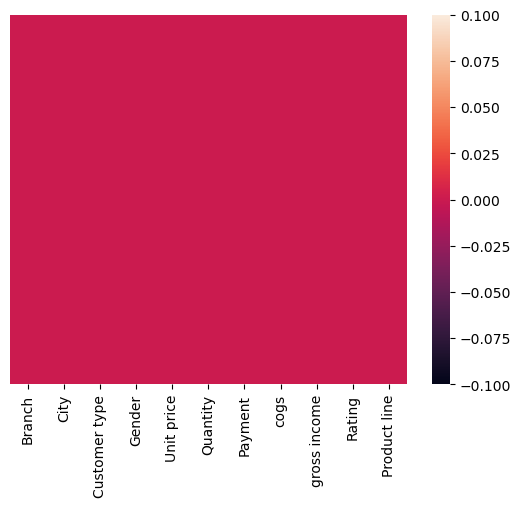

In [35]:
# Checking for missing values
sns.heatmap(dataset.isnull(),yticklabels=False)

hasNullValues = dataset.isnull().values.any()
if(hasNullValues == False):
    print("Dataset doesn't have any null value.")
else:
    print("Dataset has null values.")
    nullCount = dataset.isnull().sum().sum()
    print("Number of null values:", nullCount)

In [36]:
# Checking the columns in dataframe
dataset.columns

Index(['Branch', 'City', 'Customer type', 'Gender', 'Unit price', 'Quantity',
       'Payment', 'cogs', 'gross income', 'Rating', 'Product line'],
      dtype='object')

In [37]:
# Checking the unique values
print("Branch:", dataset.Branch.unique())
print("City:", dataset.City.unique())
print("Customer type:", dataset['Customer type'].unique())
print("Gender:", dataset.Gender.unique())
print("Payment:", dataset.Payment.unique())
print("Product line", dataset['Product line'].unique())

Branch: ['A' 'B' 'C']
City: ['Yangon' 'Mandalay' 'Naypyitaw']
Customer type: ['Normal' 'Member']
Gender: ['Male' 'Female']
Payment: ['Credit card' 'Cash' 'Ewallet']
Product line ['Sports and travel' 'Home and lifestyle' 'Electronic accessories'
 'Health and beauty' 'Fashion accessories' 'Food and beverages']


In [38]:
# Label Encoding
labelEncoder = LabelEncoder()
dataset['Branch'] = labelEncoder.fit_transform(dataset['Branch'])
dataset['City'] = labelEncoder.fit_transform(dataset['City'])
dataset['Customer type'] = labelEncoder.fit_transform(dataset['Customer type'])
dataset['Gender'] = labelEncoder.fit_transform(dataset['Gender'])
dataset['Payment'] = labelEncoder.fit_transform(dataset['Payment'])
dataset['Product line'] = labelEncoder.fit_transform(dataset['Product line'])
dataset

C:\Users\poorn\AppData\Local\Temp\ipykernel_2952\2209295117.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset['Branch'] = labelEncoder.fit_transform(dataset['Branch'])
C:\Users\poorn\AppData\Local\Temp\ipykernel_2952\2209295117.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset['City'] = labelEncoder.fit_transform(dataset['City'])
C:\Users\poorn\AppData\Local\Temp\ipykernel_2952\2209295117.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Tr

,Branch,City,Customer type,Gender,Unit price,Quantity,Payment,cogs,gross income,Rating,Product line
0,0,2,1,1,72.61,6,1,435.66,21.783,6.9,5
1,0,2,0,1,47.59,8,0,380.72,19.036,5.7,4
2,1,0,1,0,74.71,6,0,448.26,22.413,6.7,0
3,2,1,0,0,36.98,10,1,369.80,18.490,7.0,5
4,2,1,1,0,63.22,2,0,126.44,6.322,8.5,0
...,...,...,...,...,...,...,...,...,...,...,...
995,1,0,0,1,93.40,2,0,186.80,9.340,5.5,2
996,2,1,0,0,10.18,8,1,81.44,4.072,9.5,1
997,0,2,0,0,34.42,6,2,206.52,10.326,7.5,4
998,0,2,1,0,89.48,5,0,447.40,22.370,7.4,5


In [39]:
# Normalization
def min_max_normalize(data):
    min_val = np.min(data)
    max_val = np.max(data)
    data_norm = (data - min_val) / (max_val - min_val)
    return data_norm

In [40]:
dataset['Unit price'] = min_max_normalize(dataset['Unit price'])
dataset['cogs'] = min_max_normalize(dataset['cogs'])
dataset['gross income'] = min_max_normalize(dataset['gross income'])
dataset['Rating'] = min_max_normalize(dataset['Rating'])
dataset

C:\Users\poorn\AppData\Local\Temp\ipykernel_2952\1793675045.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset['Unit price'] = min_max_normalize(dataset['Unit price'])
C:\Users\poorn\AppData\Local\Temp\ipykernel_2952\1793675045.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset['cogs'] = min_max_normalize(dataset['cogs'])
C:\Users\poorn\AppData\Local\Temp\ipykernel_2952\1793675045.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

,Branch,City,Customer type,Gender,Unit price,Quantity,Payment,cogs,gross income,Rating,Product line
0,0,2,1,1,0.695705,6,1,0.432923,0.432923,0.483333,5
1,0,2,0,1,0.417334,8,0,0.377023,0.377023,0.283333,4
2,1,0,1,0,0.719070,6,0,0.445743,0.445743,0.450000,0
3,2,1,0,0,0.299288,10,1,0.365913,0.365913,0.500000,5
4,2,1,1,0,0.591233,2,0,0.118301,0.118301,0.750000,0
...,...,...,...,...,...,...,...,...,...,...,...
995,1,0,0,1,0.927014,2,0,0.179716,0.179716,0.250000,2
996,2,1,0,0,0.001113,8,1,0.072515,0.072515,0.916667,1
997,0,2,0,0,0.270806,6,2,0.199780,0.199780,0.583333,4
998,0,2,1,0,0.883400,5,0,0.444868,0.444868,0.566667,5


In [41]:
# Dividing X and Y sets
Y = dataset['Product line']
X = dataset.drop(['Product line'], axis=1)

In [42]:
# Visualizing X and Y sets
print(X)
print(Y)

     Branch  City  Customer type  Gender  Unit price  Quantity  Payment  \
0         0     2              1       1    0.695705         6        1   
1         0     2              0       1    0.417334         8        0   
2         1     0              1       0    0.719070         6        0   
3         2     1              0       0    0.299288        10        1   
4         2     1              1       0    0.591233         2        0   
..      ...   ...            ...     ...         ...       ...      ...   
995       1     0              0       1    0.927014         2        0   
996       2     1              0       0    0.001113         8        1   
997       0     2              0       0    0.270806         6        2   
998       0     2              1       0    0.883400         5        0   
999       2     1              0       1    0.965065         3        0   

         cogs  gross income    Rating  
0    0.432923      0.432923  0.483333  
1    0.377023      

In [43]:
# Splitting train and test sets
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=22)

Hyper Parameter tuning

In [16]:
# Classifiers
logisticRegression = LogisticRegression(max_iter=400)
decisionTreeClassifier = DecisionTreeClassifier()
ridgeClassifier = RidgeClassifier()
baggingClassifier = BaggingClassifier()
randomForestClassifier = RandomForestClassifier()
svc = SVC()
kneighborsClassifier = KNeighborsClassifier()
gradientBoostingClassifier = GradientBoostingClassifier()

In [17]:
# Hyper Parameter tuning
# LogisticRegression
parametersLogisticRegression={"solver":["newton-cg","lbfgs","liblinear","newton-cholesky","sag","saga"],
                              "penalty":['l2'],
                              "C":[100,10,1.0,0.1,0.01] }

tuningLogisticRegression=GridSearchCV(logisticRegression,param_grid=parametersLogisticRegression,scoring='accuracy',cv=3,verbose=3)
tuningLogisticRegression.fit(x_train, y_train)

print("Best Hyperparameters")
print("LogisticRegression", tuningLogisticRegression.best_params_, tuningLogisticRegression.best_score_)

Fitting 3 folds for each of 30 candidates, totalling 90 fits
[CV 1/3] END C=100, penalty=l2, solver=newton-cg;, score=0.154 total time=   0.0s
[CV 2/3] END C=100, penalty=l2, solver=newton-cg;, score=0.193 total time=   0.0s
[CV 3/3] END C=100, penalty=l2, solver=newton-cg;, score=0.159 total time=   0.0s
[CV 1/3] END ...C=100, penalty=l2, solver=lbfgs;, score=0.154 total time=   0.0s
[CV 2/3] END ...C=100, penalty=l2, solver=lbfgs;, score=0.193 total time=   0.0s
[CV 3/3] END ...C=100, penalty=l2, solver=lbfgs;, score=0.159 total time=   0.0s
[CV 1/3] END C=100, penalty=l2, solver=liblinear;, score=0.158 total time=   0.0s
[CV 2/3] END C=100, penalty=l2, solver=liblinear;, score=0.193 total time=   0.0s
[CV 3/3] END C=100, penalty=l2, solver=liblinear;, score=0.163 total time=   0.0s
[CV 1/3] END C=100, penalty=l2, solver=newton-cholesky;, score=0.158 total time=   0.0s
[CV 2/3] END C=100, penalty=l2, solver=newton-cholesky;, score=0.193 total time=   0.0s
[CV 3/3] END C=100, penalty=

C:\Poorna\Software\Anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Poorna\Software\Anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Poorna\Software\Anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV 2/3] END ....C=100, penalty=l2, solver=saga;, score=0.193 total time=   0.0s
[CV 3/3] END ....C=100, penalty=l2, solver=saga;, score=0.163 total time=   0.0s
[CV 1/3] END C=10, penalty=l2, solver=newton-cg;, score=0.158 total time=   0.0s
[CV 2/3] END C=10, penalty=l2, solver=newton-cg;, score=0.193 total time=   0.0s
[CV 3/3] END C=10, penalty=l2, solver=newton-cg;, score=0.167 total time=   0.0s
[CV 1/3] END ....C=10, penalty=l2, solver=lbfgs;, score=0.158 total time=   0.0s
[CV 2/3] END ....C=10, penalty=l2, solver=lbfgs;, score=0.189 total time=   0.0s
[CV 3/3] END ....C=10, penalty=l2, solver=lbfgs;, score=0.167 total time=   0.0s
[CV 1/3] END C=10, penalty=l2, solver=liblinear;, score=0.154 total time=   0.0s
[CV 2/3] END C=10, penalty=l2, solver=liblinear;, score=0.189 total time=   0.0s
[CV 3/3] END C=10, penalty=l2, solver=liblinear;, score=0.163 total time=   0.0s
[CV 1/3] END C=10, penalty=l2, solver=newton-cholesky;, score=0.158 total time=   0.0s
[CV 2/3] END C=10, pen

C:\Poorna\Software\Anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Poorna\Software\Anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Poorna\Software\Anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV 1/3] END .....C=10, penalty=l2, solver=saga;, score=0.162 total time=   0.0s
[CV 2/3] END .....C=10, penalty=l2, solver=saga;, score=0.193 total time=   0.0s
[CV 3/3] END .....C=10, penalty=l2, solver=saga;, score=0.163 total time=   0.0s
[CV 1/3] END C=1.0, penalty=l2, solver=newton-cg;, score=0.145 total time=   0.0s
[CV 2/3] END C=1.0, penalty=l2, solver=newton-cg;, score=0.180 total time=   0.0s
[CV 3/3] END C=1.0, penalty=l2, solver=newton-cg;, score=0.163 total time=   0.0s
[CV 1/3] END ...C=1.0, penalty=l2, solver=lbfgs;, score=0.145 total time=   0.0s
[CV 2/3] END ...C=1.0, penalty=l2, solver=lbfgs;, score=0.185 total time=   0.0s
[CV 3/3] END ...C=1.0, penalty=l2, solver=lbfgs;, score=0.163 total time=   0.0s
[CV 1/3] END C=1.0, penalty=l2, solver=liblinear;, score=0.141 total time=   0.0s
[CV 2/3] END C=1.0, penalty=l2, solver=liblinear;, score=0.180 total time=   0.0s
[CV 3/3] END C=1.0, penalty=l2, solver=liblinear;, score=0.167 total time=   0.0s
[CV 1/3] END C=1.0, pe

In [15]:
# Hyper Parameter tuning
# DecisionTreeClassifier
parametersDecisionTreeClassifier={"splitter":["best","random"],
                                 "max_depth" : [1,3,5,7,9,11,12],
                                 "min_samples_leaf":[1,2,3,4,5,6,7,8,9,10],
                                 "min_weight_fraction_leaf":[0.1,0.2,0.3,0.4,0.5],
                                 "max_features":["log2","sqrt",None],
                                 "max_leaf_nodes":[None,10,20,30,40,50,60,70,80,90] }

tuningDecisionTreeClassifier=GridSearchCV(decisionTreeClassifier,param_grid=parametersDecisionTreeClassifier,scoring='accuracy',cv=3,verbose=3)
tuningDecisionTreeClassifier.fit(x_train, y_train)

print("Best Hyperparameters")
print("DecisionTreeClassifier", tuningDecisionTreeClassifier.best_params_, tuningDecisionTreeClassifier.best_score_)

Fitting 3 folds for each of 21000 candidates, totalling 63000 fits
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=0.171 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=0.163 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=0.172 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=0.154 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=0.155 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1

In [16]:
# Hyper Parameter tuning
# RidgeClassifier
parametersRidgeClassifier={"alpha" : [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0] }

tuningRidgeClassifier=GridSearchCV(ridgeClassifier,param_grid=parametersRidgeClassifier,scoring='accuracy',cv=3,verbose=3)
tuningRidgeClassifier.fit(x_train, y_train)

print("Best Hyperparameters")
print("RidgeClassifier", tuningRidgeClassifier.best_params_, tuningRidgeClassifier.best_score_)

Fitting 3 folds for each of 10 candidates, totalling 30 fits
[CV 1/3] END .........................alpha=0.1;, score=0.154 total time=   0.0s
[CV 2/3] END .........................alpha=0.1;, score=0.180 total time=   0.0s
[CV 3/3] END .........................alpha=0.1;, score=0.167 total time=   0.0s
[CV 1/3] END .........................alpha=0.2;, score=0.158 total time=   0.0s
[CV 2/3] END .........................alpha=0.2;, score=0.180 total time=   0.0s
[CV 3/3] END .........................alpha=0.2;, score=0.167 total time=   0.0s
[CV 1/3] END .........................alpha=0.3;, score=0.158 total time=   0.0s
[CV 2/3] END .........................alpha=0.3;, score=0.180 total time=   0.0s
[CV 3/3] END .........................alpha=0.3;, score=0.167 total time=   0.0s
[CV 1/3] END .........................alpha=0.4;, score=0.162 total time=   0.0s
[CV 2/3] END .........................alpha=0.4;, score=0.180 total time=   0.0s
[CV 3/3] END .........................alpha=0.4;

In [17]:
# Hyper Parameter tuning
# BaggingClassifier
parametersBaggingClassifier={"n_estimators" : [10, 100, 1000] }

tuningBaggingClassifier=GridSearchCV(baggingClassifier,param_grid=parametersBaggingClassifier,scoring='accuracy',cv=3,verbose=3)
tuningBaggingClassifier.fit(x_train, y_train)

print("Best Hyperparameters")
print("BaggingClassifier", tuningBaggingClassifier.best_params_, tuningBaggingClassifier.best_score_)

Fitting 3 folds for each of 3 candidates, totalling 9 fits
[CV 1/3] END ...................n_estimators=10;, score=0.171 total time=   0.0s
[CV 2/3] END ...................n_estimators=10;, score=0.150 total time=   0.0s
[CV 3/3] END ...................n_estimators=10;, score=0.167 total time=   0.0s
[CV 1/3] END ..................n_estimators=100;, score=0.188 total time=   0.2s
[CV 2/3] END ..................n_estimators=100;, score=0.197 total time=   0.2s
[CV 3/3] END ..................n_estimators=100;, score=0.150 total time=   0.2s
[CV 1/3] END .................n_estimators=1000;, score=0.188 total time=   2.6s
[CV 2/3] END .................n_estimators=1000;, score=0.193 total time=   2.4s
[CV 3/3] END .................n_estimators=1000;, score=0.167 total time=   2.6s
Best Hyperparameters
BaggingClassifier {'n_estimators': 1000} 0.18284973649780514


In [20]:
# Hyper Parameter tuning
# RandomForestClassifier
parametersRandomForestClassifier={"n_estimators" : [10, 100, 1000],
                                  "max_features" : ["sqrt", "log2"]}

tuningRandomForestClassifier=GridSearchCV(randomForestClassifier,param_grid=parametersRandomForestClassifier,scoring='accuracy',cv=3,verbose=3)
tuningRandomForestClassifier.fit(x_train, y_train)

print("Best Hyperparameters")
print("RandomForestClassifier", tuningRandomForestClassifier.best_params_, tuningRandomForestClassifier.best_score_)

Fitting 3 folds for each of 6 candidates, totalling 18 fits
[CV 1/3] END max_features=sqrt, n_estimators=10;, score=0.158 total time=   0.0s
[CV 2/3] END max_features=sqrt, n_estimators=10;, score=0.172 total time=   0.0s
[CV 3/3] END max_features=sqrt, n_estimators=10;, score=0.176 total time=   0.0s
[CV 1/3] END max_features=sqrt, n_estimators=100;, score=0.179 total time=   0.1s
[CV 2/3] END max_features=sqrt, n_estimators=100;, score=0.180 total time=   0.1s
[CV 3/3] END max_features=sqrt, n_estimators=100;, score=0.185 total time=   0.1s
[CV 1/3] END max_features=sqrt, n_estimators=1000;, score=0.179 total time=   1.6s
[CV 2/3] END max_features=sqrt, n_estimators=1000;, score=0.180 total time=   1.7s
[CV 3/3] END max_features=sqrt, n_estimators=1000;, score=0.176 total time=   1.7s
[CV 1/3] END max_features=log2, n_estimators=10;, score=0.175 total time=   0.0s
[CV 2/3] END max_features=log2, n_estimators=10;, score=0.176 total time=   0.0s
[CV 3/3] END max_features=log2, n_estima

In [21]:
# Hyper Parameter tuning
# Support Vector Classification (SVC)
parametersSVC={"kernel" : ["linear", "poly", "rbf", "sigmoid"],
               "C" : [50, 10, 1.0, 0.1, 0.01],
               "gamma" : ['scale'] }

tuningSVC=GridSearchCV(svc,param_grid=parametersSVC,scoring='accuracy',cv=3,verbose=3)
tuningSVC.fit(x_train, y_train)

print("Best Hyperparameters")
print("SVC", tuningSVC.best_params_, tuningSVC.best_score_)

Fitting 3 folds for each of 20 candidates, totalling 60 fits
[CV 1/3] END ..C=50, gamma=scale, kernel=linear;, score=0.158 total time=   0.2s
[CV 2/3] END ..C=50, gamma=scale, kernel=linear;, score=0.167 total time=   4.2s
[CV 3/3] END ..C=50, gamma=scale, kernel=linear;, score=0.150 total time=   1.6s
[CV 1/3] END ....C=50, gamma=scale, kernel=poly;, score=0.171 total time=   0.0s
[CV 2/3] END ....C=50, gamma=scale, kernel=poly;, score=0.215 total time=   0.0s
[CV 3/3] END ....C=50, gamma=scale, kernel=poly;, score=0.180 total time=   0.0s
[CV 1/3] END .....C=50, gamma=scale, kernel=rbf;, score=0.188 total time=   0.0s
[CV 2/3] END .....C=50, gamma=scale, kernel=rbf;, score=0.176 total time=   0.0s
[CV 3/3] END .....C=50, gamma=scale, kernel=rbf;, score=0.189 total time=   0.0s
[CV 1/3] END .C=50, gamma=scale, kernel=sigmoid;, score=0.167 total time=   0.0s
[CV 2/3] END .C=50, gamma=scale, kernel=sigmoid;, score=0.180 total time=   0.0s
[CV 3/3] END .C=50, gamma=scale, kernel=sigmoid;

In [22]:
# Hyper Parameter tuning
# KNeighborsClassifier
parametersKNeighborsClassifier={"n_neighbors" : [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
               "weights" : ["uniform", "distance"],
               "leaf_size" : [1, 5, 10, 20, 30, 40, 50, 100],
               "p" : [1, 2] }

tuningKNeighborsClassifier=GridSearchCV(kneighborsClassifier,param_grid=parametersKNeighborsClassifier,scoring='accuracy',cv=3,verbose=3)
tuningKNeighborsClassifier.fit(x_train, y_train)

print("Best Hyperparameters")
print("KNeighborsClassifier", tuningKNeighborsClassifier.best_params_, tuningKNeighborsClassifier.best_score_)

Fitting 3 folds for each of 320 candidates, totalling 960 fits
[CV 1/3] END leaf_size=1, n_neighbors=1, p=1, weights=uniform;, score=0.214 total time=   0.0s
[CV 2/3] END leaf_size=1, n_neighbors=1, p=1, weights=uniform;, score=0.159 total time=   0.0s
[CV 3/3] END leaf_size=1, n_neighbors=1, p=1, weights=uniform;, score=0.193 total time=   0.0s
[CV 1/3] END leaf_size=1, n_neighbors=1, p=1, weights=distance;, score=0.214 total time=   0.0s
[CV 2/3] END leaf_size=1, n_neighbors=1, p=1, weights=distance;, score=0.159 total time=   0.0s
[CV 3/3] END leaf_size=1, n_neighbors=1, p=1, weights=distance;, score=0.193 total time=   0.0s
[CV 1/3] END leaf_size=1, n_neighbors=1, p=2, weights=uniform;, score=0.214 total time=   0.0s
[CV 2/3] END leaf_size=1, n_neighbors=1, p=2, weights=uniform;, score=0.176 total time=   0.0s
[CV 3/3] END leaf_size=1, n_neighbors=1, p=2, weights=uniform;, score=0.197 total time=   0.0s
[CV 1/3] END leaf_size=1, n_neighbors=1, p=2, weights=distance;, score=0.214 to

In [23]:
# Hyper Parameter tuning
# GradientBoostingClassifier
parametersGradientBoostingClassifier={"learning_rate" : [0.0001],
                                      "n_estimators" : [100],
                                      "subsample" : [0.1, 0.5, 1.0],
                                      "min_samples_split" : [2] }

tuningGradientBoostingClassifier=GridSearchCV(gradientBoostingClassifier,param_grid=parametersGradientBoostingClassifier,scoring='accuracy',cv=3,verbose=3)
tuningGradientBoostingClassifier.fit(x_train, y_train)

print("Best Hyperparameters")
print("GradientBoostingClassifier", tuningGradientBoostingClassifier.best_params_, tuningGradientBoostingClassifier.best_score_)

Fitting 3 folds for each of 3 candidates, totalling 9 fits
[CV 1/3] END learning_rate=0.0001, min_samples_split=2, n_estimators=100, subsample=0.1;, score=0.175 total time=   0.3s
[CV 2/3] END learning_rate=0.0001, min_samples_split=2, n_estimators=100, subsample=0.1;, score=0.172 total time=   0.3s
[CV 3/3] END learning_rate=0.0001, min_samples_split=2, n_estimators=100, subsample=0.1;, score=0.176 total time=   0.3s
[CV 1/3] END learning_rate=0.0001, min_samples_split=2, n_estimators=100, subsample=0.5;, score=0.171 total time=   0.5s
[CV 2/3] END learning_rate=0.0001, min_samples_split=2, n_estimators=100, subsample=0.5;, score=0.185 total time=   0.4s
[CV 3/3] END learning_rate=0.0001, min_samples_split=2, n_estimators=100, subsample=0.5;, score=0.176 total time=   0.4s
[CV 1/3] END learning_rate=0.0001, min_samples_split=2, n_estimators=100, subsample=1.0;, score=0.171 total time=   0.5s
[CV 2/3] END learning_rate=0.0001, min_samples_split=2, n_estimators=100, subsample=1.0;, scor

Model Training and Evaluation

In [44]:
# Classifiers
logisticRegression = LogisticRegression(C=0.01, penalty='l2', solver='newton-cg', max_iter=400)
decisionTreeClassifier = DecisionTreeClassifier(max_depth=5, max_features='log2', max_leaf_nodes=60, min_samples_leaf=8, 
                                                min_weight_fraction_leaf=0.1, splitter='random')
ridgeClassifier = RidgeClassifier(alpha=0.4)
baggingClassifier = BaggingClassifier(n_estimators=1000)
randomForestClassifier = RandomForestClassifier(max_features='sqrt', n_estimators=100)
svc = SVC(C = 50, gamma = 'scale', kernel = 'poly')
kneighborsClassifier = KNeighborsClassifier(leaf_size = 1, n_neighbors = 1, p = 2, weights = 'uniform')
gradientBoostingClassifier = GradientBoostingClassifier(learning_rate=0.0001, min_samples_split=2, n_estimators=100, subsample=1.0)

In [ ]:
modelLogisticRegression = logisticRegression.fit(x_train, y_train)
modelDecisionTreeClassifier = decisionTreeClassifier.fit(x_train, y_train)
modelRidgeClassifier = ridgeClassifier.fit(x_train, y_train)
modelBaggingClassifier = baggingClassifier.fit(x_train, y_train)
modelRandomForestClassifier = randomForestClassifier.fit(x_train, y_train)
modelSVC = svc.fit(x_train, y_train)
modelKNeighborsClassifier = kneighborsClassifier.fit(x_train, y_train)
modelGradientBoostingClassifier = gradientBoostingClassifier.fit(x_train, y_train)

In [ ]:
modelLogisticRegression_trainPred = modelLogisticRegression.predict(x_train)
modelDecisionTreeClassifier_trainPred = modelDecisionTreeClassifier.predict(x_train)
modelRidgeClassifier_trainPred = modelRidgeClassifier.predict(x_train)
modelBaggingClassifier_trainPred = modelBaggingClassifier.predict(x_train)
modelRandomForestClassifier_trainPred = modelRandomForestClassifier.predict(x_train)
modelSVC_trainPred = modelSVC.predict(x_train)
modelKNeighborsClassifier_trainPred = modelKNeighborsClassifier.predict(x_train)
modelGradientBoostingClassifier_trainPred = modelGradientBoostingClassifier.predict(x_train)

modelLogisticRegression_testPred = modelLogisticRegression.predict(x_test)
modelDecisionTreeClassifier_testPred = modelDecisionTreeClassifier.predict(x_test)
modelRidgeClassifier_testPred = modelRidgeClassifier.predict(x_test)
modelBaggingClassifier_testPred = modelBaggingClassifier.predict(x_test)
modelRandomForestClassifier_testPred = modelRandomForestClassifier.predict(x_test)
modelSVC_testPred = modelSVC.predict(x_test)
modelKNeighborsClassifier_testPred = modelKNeighborsClassifier.predict(x_test)
modelGradientBoostingClassifier_testPred = modelGradientBoostingClassifier.predict(x_test)

In [ ]:
modelGradientBoostingClassifier_testPred

In [ ]:
modelLogisticRegression_trainAccuracy = accuracy_score(y_train, modelLogisticRegression_trainPred)
modelDecisionTreeClassifier_trainAccuracy = accuracy_score(y_train, modelDecisionTreeClassifier_trainPred)
modelRidgeClassifier_trainAccuracy = accuracy_score(y_train, modelRidgeClassifier_trainPred)
modelBaggingClassifier_trainAccuracy = accuracy_score(y_train, modelBaggingClassifier_trainPred)
modelRandomForestClassifier_trainAccuracy = accuracy_score(y_train, modelRandomForestClassifier_trainPred)
modelSVC_trainAccuracy = accuracy_score(y_train, modelSVC_trainPred)
modelKNeighborsClassifier_trainAccuracy = accuracy_score(y_train, modelKNeighborsClassifier_trainPred)
modelGradientBoostingClassifier_trainAccuracy = accuracy_score(y_train, modelGradientBoostingClassifier_trainPred)

modelLogisticRegression_testAccuracy = accuracy_score(y_test, modelLogisticRegression_testPred)
modelDecisionTreeClassifier_testAccuracy = accuracy_score(y_test, modelDecisionTreeClassifier_testPred)
modelRidgeClassifier_testAccuracy = accuracy_score(y_test, modelRidgeClassifier_testPred)
modelBaggingClassifier_testAccuracy = accuracy_score(y_test, modelBaggingClassifier_testPred)
modelRandomForestClassifier_testAccuracy = accuracy_score(y_test, modelRandomForestClassifier_testPred)
modelSVC_testAccuracy = accuracy_score(y_test, modelSVC_testPred)
modelKNeighborsClassifier_testAccuracy = accuracy_score(y_test, modelKNeighborsClassifier_testPred)
modelGradientBoostingClassifier_testAccuracy = accuracy_score(y_test, modelGradientBoostingClassifier_testPred)

In [103]:
print("Training Accuracy")
print("LogisticRegression_accuracy\t:", modelLogisticRegression_trainAccuracy)
print("DecisionTreeClassifier_accuracy\t:", modelDecisionTreeClassifier_trainAccuracy)
print("RidgeClassifier_accuracy\t:", modelRidgeClassifier_trainAccuracy)
print("BaggingClassifier_accuracy\t:", modelBaggingClassifier_trainAccuracy)
print("RandomForestClassifier_accuracy\t:", modelRandomForestClassifier_trainAccuracy)
print("SVC\t\t\t\t:", modelSVC_trainAccuracy)
print("KNeighborsClassifier\t\t:", modelKNeighborsClassifier_trainAccuracy)
print("GradientBoostingClassifier\t:", modelGradientBoostingClassifier_trainAccuracy)

print("\nTesting Accuracy")
print("LogisticRegression_accuracy\t:", modelLogisticRegression_testAccuracy)
print("DecisionTreeClassifier_accuracy\t:", modelDecisionTreeClassifier_testAccuracy)
print("RidgeClassifier_accuracy\t:", modelRidgeClassifier_testAccuracy)
print("BaggingClassifier_accuracy\t:", modelBaggingClassifier_testAccuracy)
print("RandomForestClassifier_accuracy\t:", modelRandomForestClassifier_testAccuracy)
print("SVC\t\t\t\t:", modelSVC_testAccuracy)
print("KNeighborsClassifier\t\t:", modelKNeighborsClassifier_testAccuracy)
print("GradientBoostingClassifier\t:", modelGradientBoostingClassifier_testAccuracy)

Training Accuracy
LogisticRegression_accuracy	: 0.21571428571428572
DecisionTreeClassifier_accuracy	: 0.21714285714285714
RidgeClassifier_accuracy	: 0.22285714285714286
BaggingClassifier_accuracy	: 1.0
RandomForestClassifier_accuracy	: 1.0
SVC				: 0.30857142857142855
KNeighborsClassifier		: 1.0
GradientBoostingClassifier	: 0.19

Testing Accuracy
LogisticRegression_accuracy	: 0.16666666666666666
DecisionTreeClassifier_accuracy	: 0.18666666666666668
RidgeClassifier_accuracy	: 0.17
BaggingClassifier_accuracy	: 0.13333333333333333
RandomForestClassifier_accuracy	: 0.14
SVC				: 0.17333333333333334
KNeighborsClassifier		: 0.15333333333333332
GradientBoostingClassifier	: 0.15666666666666668


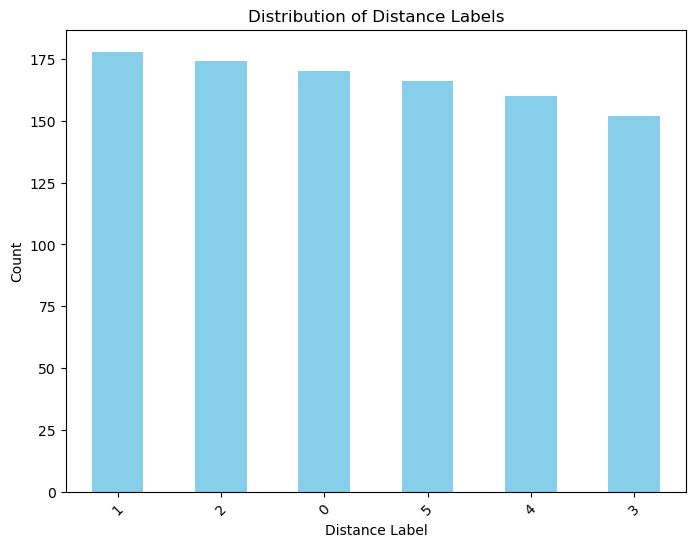

In [12]:
class_counts = dataset['Product line'].value_counts()

# Visualize the distribution
plt.figure(figsize=(8, 6))
class_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Distance Labels')
plt.xlabel('Distance Label')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

In [22]:
import xgboost as xgb

model = xgb.XGBClassifier()
model.fit(x_train, y_train)
predictions = model.predict(x_test)
accuracy = accuracy_score(y_test, predictions)

print("Accuracy:", accuracy)
print("\nClassification Report:")
print(classification_report(y_test, predictions))

Accuracy: 0.17

Classification Report:
              precision    recall  f1-score   support

           0       0.14      0.15      0.14        46
           1       0.29      0.22      0.25        67
           2       0.30      0.24      0.26        55
           3       0.06      0.07      0.07        41
           4       0.13      0.12      0.13        48
           5       0.12      0.16      0.14        43

    accuracy                           0.17       300
   macro avg       0.17      0.16      0.17       300
weighted avg       0.19      0.17      0.18       300

